<a href="https://colab.research.google.com/github/Lufec/Car_Plate_Digits_YOLOv5/blob/main/2_Yolov5_L4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Setting Up The YOLOv5 Environment

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -U -r yolov5/requirements.txt  # install dependencies

In [ ]:
#installing for google colab GPU use
!pip install torch==1.8.1+cu101 torchvision==0.9.1+cu101 -f https://download.pytorch.org/whl/torch_stable.html

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
!ls

data	    hubconf.py	README.md	  train.py	  weights
detect.py   LICENSE	requirements.txt  tutorial.ipynb
Dockerfile  models	test.py		  utils


In [ ]:
import torch
from IPython.display import Image  # for displaying images
from utils.google_utils import gdrive_download  # for downloading models/datasets

print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.8.1+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


## Downloading the data

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!cp '/content/gdrive/My Drive/Placas/data2.zip' /content/yolov5/data2.zip

In [ ]:
!unzip data2.zip > /dev/null

The dataset got downloaded inside the yolov5 folder. 

Path to train dataset - /content/yolov5/train 

Path to test dataset - /content/yolov5/test

## Define Model Configuration and Architecture

In [ ]:
%cat data.yaml

train: ./training/images
test: ./testing/images
val: ./validation/images

nc: 36
names: ['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z','0','1','2','3','4','5','6','7','8','9']

Path to the train and test dataset is not correct. We need to edit it in the next steps

In [ ]:
# define number of classes based on YAML
# data.yaml contains the information about number of classes and their labels required for this project
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
# Below we are changing the data configuration for right path to the dataset
%%writetemplate /content/yolov5/data.yaml

train: ./training/images
test: ./testing/images
val: ./validation/images

nc: 36
names: ['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R',
        'S','T','U','V','W','X','Y','Z','0','1','2','3','4','5','6','7','8','9']

In [ ]:
#Let's check the data.yaml file for confirmation

%cat data.yaml


train: ./training/images
test: ./testing/images
val: ./validation/images

nc: 36
names: ['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R',
        'S','T','U','V','W','X','Y','Z','0','1','2','3','4','5','6','7','8','9']

In [ ]:
with open(r'data.yaml') as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list['names']

In [ ]:
print("Number of Classes are {}, whose labels are {} for this Object Detection project".format(num_classes,label_names))

Number of Classes are 36, whose labels are ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] for this Object Detection project


In [ ]:
#this is the model configuration we will use for our tutorial 
# yolov5s.yaml contains the configuration of neural network required for training.
%cat /content/yolov5/models/yolov5x.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 1.33  # model depth multiple
width_multiple: 1.25  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
# Below we are changing the configuration so that it becomes compatible to number of classes required in this project
%%writetemplate /content/yolov5/models/custom_yolov5x.yaml

# parameters
nc: 36  # number of classes
depth_multiple: 1.33  # model depth multiple
width_multiple: 1.25  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Train Custom YOLOv5 Detector

### Next, we'll fire off training!¶
Here, we are able to pass a number of arguments:

* **img:** define input image size
* **batch:** determine batch size
* **epochs:** define the number of training epochs. 
* **data:** set the path to our yaml file
* **cfg:** specify our model configuration
* **weights:** specify a custom path to weights. 
* **name:** result names
* **nosave:** only save the final checkpoint
* **cache:** cache images for faster training





In [ ]:
import os
os.chdir('/content/yolov5')

In [ ]:
# train yolov5s on Aquarium object detection data for 100 epochs [aroung 1000 epochs for better training and result]
# NOTE: All the images are already pre-processed to 416 x 416 size.
# We will be training for 100 epoch (increase it for better result) with batch size of 80
# data.yaml also contains the information about location of Train and Validation Data. That's how you get the train data.
# the training also requires the configuration of neural network, which is in custom_yolov5s.yaml
# weights will be by-default stored at /content/yolov5/runs/exp2/weights/best.pt
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 160 --batch 32 --epochs 200 --data './data.yaml' --cfg ./models/custom_yolov5x.yaml --weights ''

/content/yolov5
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-34-geae28a9 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=32, bbox_interval=-1, bucket='', cache_images=False, cfg='./models/custom_yolov5x.yaml', data='./data.yaml', device='', entity=None, epochs=200, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[160, 160], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/exp2', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=32, upload_dataset=False, weights='', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2021-04-24 20:13:09.700434: I tensorflow/stream_executor/platform/default/dso_loader.c

## Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`

In [ ]:
# Start tensorboard
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 414), started 1:33:26 ago. (Use '!kill 414' to kill it.)

<IPython.core.display.Javascript object>

## Curious? Visualize Our Training Data with Labels
After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4.](https://arxiv.org/abs/2004.10934)



GROUND TRUTH TRAINING DATA:


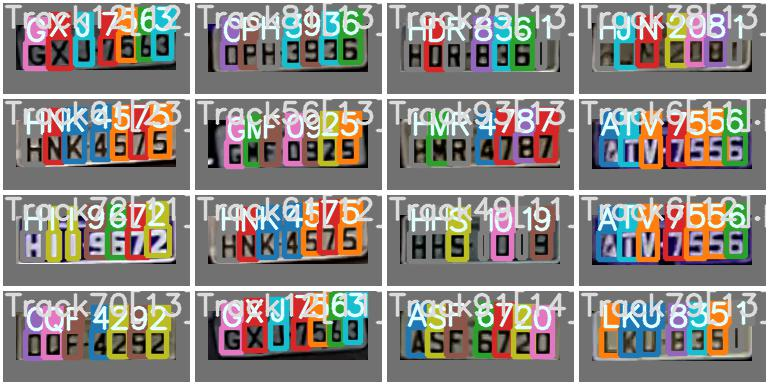

In [ ]:
# first, display our ground truth data
# The ground truth [Train data] is available in jpg file at location /content/yolov5/runs/train/exp/test_batch0_labels.jpg 
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/exp2/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


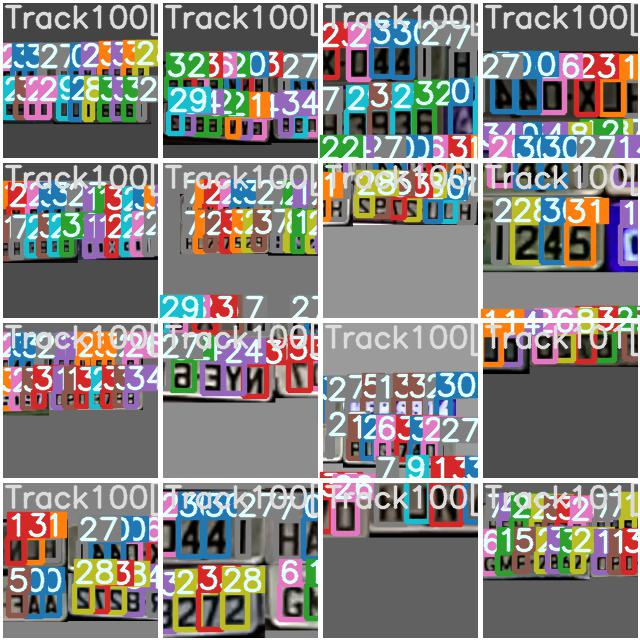

In [ ]:
# print out an augmented training example
# Below is the augmented training data.
# NOTE: The dataset already contains the augmented data with annotations, so that you dont have to do it.
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/exp2/train_batch0.jpg', width=900)

# Run Inference With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# use the best weights!
# Final weights will be by-default stored at /content/yolov5/runs/train/exp2/weights/best.pt
%cd /content/yolov5/
!python detect.py --weights /content/gdrive/MyDrive/Placas/best.pt --img 160 --conf 0.4 --source ./testing/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, hide_conf=False, hide_labels=False, img_size=160, iou_thres=0.45, line_thickness=3, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='./testing/images', update=False, view_img=False, weights=['/content/gdrive/MyDrive/Placas/best.pt'])
YOLOv5 🚀 v5.0-47-ga833ee2 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 476 layers, 87434209 parameters, 0 gradients, 217.8 GFLOPS
image 1/224 /content/yolov5/testing/images/Track100[11].png: 64x160 1 H, 1 L, 1 X, 1 0, 1 1, 2 4s, Done. (0.026s)
image 2/224 /content/yolov5/testing/images/Track100[12].png: 64x160 1 H, 1 L, 1 X, 1 0, 1 1, 2 4s, Done. (0.025s)
image 3/224 /content/yolov5/testing/images/Track101[11].png: 64x160 1 E, 1 H, 1 W, 1 0, 1 2, 1 7, 1 9, Done. (0.022s)
image 4/224 /content/yolov5/testing/images/Track101[12].png: 64x160 1 E, 1 H,

### Let's check the output

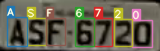

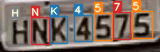

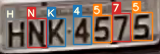

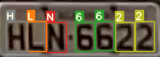

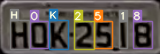

...

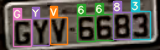

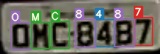

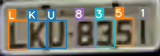

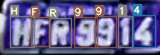

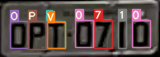

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display
i = 0
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")
    i+=1

In [ ]:
!python test.py --weights /content/gdrive/MyDrive/Placas/best.pt --data './data.yaml' --img-size 160 \
                --batch-size 1 --conf-thres 0.7 --iou-thres 0.1 --task test --verbose --save-hybrid --save-conf

Namespace(augment=False, batch_size=1, conf_thres=0.7, data='./data.yaml', device='', exist_ok=False, img_size=160, iou_thres=0.1, name='exp', project='runs/test', save_conf=True, save_hybrid=True, save_json=False, save_txt=False, single_cls=False, task='test', verbose=True, weights=['/content/gdrive/MyDrive/Placas/best.pt'])
YOLOv5 🚀 v5.0-45-g33712d6 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 476 layers, 87434209 parameters, 0 gradients, 217.8 GFLOPS
test: Scanning 'testing/labels' images and labels... 224 found, 0 missing, 0 empty, 0 corrupted: 100% 224/224 [00:00<00:00, 3134.64it/s]
test: New cache created: testing/labels.cache
               Class      Images      Labels           P           R      mAP@.5  mAP@.5:.95: 100% 224/224 [00:05<00:00, 43.38it/s]
                 all         224        1568           1           1           1           1
                   A         224          15           1           1           1           1
    

In [ ]:
!python test.py --weights /content/gdrive/MyDrive/Placas/best.pt --data './data.yaml' --img-size 160 \
                --batch-size 16 --conf-thres 0.7 --iou-thres 0.6 --task train --verbose 

Namespace(augment=False, batch_size=16, conf_thres=0.7, data='./data.yaml', device='', exist_ok=False, img_size=160, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='train', verbose=True, weights=['/content/gdrive/MyDrive/Placas/best.pt'])
YOLOv5 🚀 v5.0-47-ga833ee2 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 476 layers, 87434209 parameters, 0 gradients, 217.8 GFLOPS
train: Scanning 'training/labels.cache' images and labels... 1548 found, 0 missing, 0 empty, 0 corrupted: 100% 1548/1548 [00:00<?, ?it/s]
               Class      Images      Labels           P           R      mAP@.5  mAP@.5:.95: 100% 97/97 [00:12<00:00,  7.61it/s]
                 all        1548       10836       0.942       0.866       0.868       0.686
                   A        1548         129           1           1           1       0.765
                   B        1548          96   

In [ ]:
!python test.py --weights /content/gdrive/MyDrive/Placas/best.pt --data './data.yaml' --img-size 160 \
                --batch-size 16 --conf-thres 0.5 --iou-thres 0.6  --task val --verbose --save-hybrid

Namespace(augment=False, batch_size=16, conf_thres=0.5, data='./data.yaml', device='', exist_ok=False, img_size=160, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=True, save_json=False, save_txt=False, single_cls=False, task='val', verbose=True, weights=['/content/gdrive/MyDrive/Placas/best.pt'])
YOLOv5 🚀 v5.0-47-ga833ee2 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 476 layers, 87434209 parameters, 0 gradients, 217.8 GFLOPS
val: Scanning 'validation/labels.cache' images and labels... 223 found, 0 missing, 0 empty, 0 corrupted: 100% 223/223 [00:00<?, ?it/s]
               Class      Images      Labels           P           R      mAP@.5  mAP@.5:.95: 100% 14/14 [00:02<00:00,  5.36it/s]
                 all         223        1561           1           1           1           1
                   A         223          13           1           1           1           1
                   B         223          12         

## Export Trained Weights for Future Inference
Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

%cp /content/yolov5/runs/train/exp2/weights/best.pt /content/gdrive/My\ Drive/Placas

In [ ]:

%cp -R /content/yolov5/runs/test/exp10 /content/gdrive/My\ Drive/Placas